# Colour categories, colour space transformations and colour visualisations

Install the colour library if needed

Bash: ```pip install --user colour-science```

In [10]:
pip install --user colour-science

DEPRECATION: Loading egg at /opt/anaconda3/lib/python3.12/site-packages/jupyter-1.0.0-py3.12.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
DEPRECATION: Loading egg at /opt/anaconda3/lib/python3.12/site-packages/jsonpointer-3.0.0-py3.12.egg is deprecated. pip 25.1 will enforce this behaviour change. A possible replacement is to use pip for package installation. Discussion can be found at https://github.com/pypa/pip/issues/12330
Note: you may need to restart the kernel to use updated packages.


In [1]:
import colour
import numpy as np
import pandas as pd

import requests
import urllib.request
import json 

import altair as alt
from PIL import ImageColor
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import HTML
import plotly.graph_objects as go

from vega_datasets import data as vega_data

## Compute centroids of colour categories 
Colour names are labels for colour categories. Calculate their centres of mass in RGB (average RGB triplet)


In [5]:
def centroid(rgb_list):
    # compute average of 3D coordinates
    return np.mean(rgb_list, axis=0) / 255 # in 0-1 scale

# Sample dataframe with RGB values for Yellow and Teal
data = {
    'color': ['Yellow', 'Yellow', 'Teal', 'Teal'],
    'R': [255, 255, 0, 0],
    'G': [255, 255, 128, 128],
    'B': [0, 0, 128, 128]
}

# Create DataFrame
df = pd.DataFrame(data)

# Group by color label and compute centroid
centroids = df.groupby('color')[['R', 'G', 'B']].apply(centroid).reset_index()
print(centroids)
# Get teal centroid in RGB 
teal = centroids[centroids['color'] == 'Teal'][['R', 'G', 'B']].values.tolist()[0]

    color    R         G         B
0    Teal  0.0  0.501961  0.501961
1  Yellow  1.0  1.000000  0.000000


Centroid in RGB: [0.0, 0.5019607843137255, 0.5019607843137255]
HEX: #008080


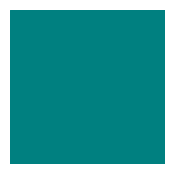

In [7]:
# Usage
print(f"Centroid in RGB: {teal}")
print(f"HEX: {colour.notation.RGB_to_HEX(teal)}")

# Display a patch with the centroid RGB colour
fig, ax = plt.subplots(figsize=(2, 2))
ax.add_patch(plt.Rectangle((0, 0), 1, 1, color= teal))
ax.set_axis_off()
plt.show()

## Colour transformations from sRGB to CIE XYZ 1931 to CIELAB to CIELCh

In [9]:
# Assuming sRGB convert RGB to XYZ to CIELAB and to CIE LCh
print(f"CIELAB: {colour.XYZ_to_Lab(colour.sRGB_to_XYZ(teal))}")
print(f"LCH: {colour.Lab_to_LCHab(colour.XYZ_to_Lab(colour.sRGB_to_XYZ(teal)))}")

CIELAB: [ 48.25607381 -28.84033485  -8.47273552]
LCH: [  48.25607381   30.05914439  196.37177336]


## Inverse colour transformations from CIE LCh back to RGB

In [13]:
LCh = colour.Lab_to_LCHab(colour.XYZ_to_Lab(colour.sRGB_to_XYZ(teal)))
RGB = colour.XYZ_to_sRGB(colour.Lab_to_XYZ(colour.LCHab_to_Lab(LCh)))
print(f"LCh: {LCh}\nRGB: {RGB}") 

LCh: [  48.25607381   30.05914439  196.37177336]
RGB: [  6.45913330e-05   5.01968299e-01   5.01964374e-01]


## Create a grid of RGB coordinates and plot in a 3D scatter plot

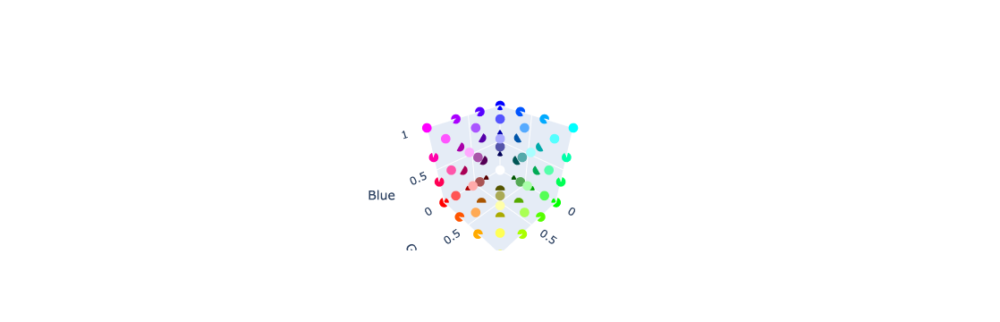

In [17]:
# Create a grid of test colours in RGB
bits = 4  # Define resolution
scale = np.linspace(0, 1, bits)
X, Y, Z = np.meshgrid(scale, scale, scale)
colors = np.stack((X.flatten(), Y.flatten(), Z.flatten()), axis=1)

# Convert RGB values (0-1 range) to 0-255 range for Plotly
colors_255 = (colors * 255).astype(int)

# Create the 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(
    x=X.flatten(),
    y=Y.flatten(),
    z=Z.flatten(),
    mode='markers',
    marker=dict(
        size=6,  
        color=colors_255, 
        opacity= 1       
    )
)])
fig.update_layout(
    scene=dict(
        xaxis_title="Red",
        yaxis_title="Green",
        zaxis_title="Blue",
        xaxis=dict(range=[0, 1]),
        yaxis=dict(range=[0, 1]),
        zaxis=dict(range=[0, 1])
    )
)

fig.show()

## Transform RGB grid to CIELAB and plot in a 3D scatter plot

In [19]:
# Convert RGB to Lab
colors_lab = np.array([colour.XYZ_to_Lab(colour.sRGB_to_XYZ(rgb)) for rgb in colors])

# Extract Lab channels
L = colors_lab[:, 0]  # L channel
a = colors_lab[:, 1]  # a channel
b = colors_lab[:, 2]  # b channel

# Plot
fig = plt.figure()
fig.subplots_adjust(left=0, bottom=0, right=1, top=1)
ax = fig.add_subplot(111, projection='3d')
ax.set_facecolor((0.5, 0.5, 0.5))

# 3D scatter plot in Lab space
sc = ax.scatter(a, b, L, alpha=1.0, s=100. / bits, c=colors, marker='o', linewidths=0)

# Set axis labels
ax.set_xlabel('a*')
ax.set_ylabel('b*')
ax.set_zlabel('L*')

# Animate grid
def update(i):
    ax.view_init(elev=20., azim=i)
    return fig,

anim = FuncAnimation(fig, update, frames=np.arange(0, 360, 2), repeat=True)

# Avoid double plot
plt.close(fig)

# Display animation in Jupyter Notebook
HTML(anim.to_jshtml())


## Use the Colournamer API to get centroids of basic colour terms

In [21]:
def name2color(name):
    'Send a name and get the RGB of its centroid from ColourNamer'
    with urllib.request.urlopen(f'http://colornaming.net/namer/lang/en/colours/{name}') as url:
        data = json.loads(url.read().decode())
        rgb = [i/255 for i in ImageColor.getrgb("#" + data['hex'])]
        return rgb
    
# Usage
words = ['black', 'blue', 'pink','brown', 'green', 'grey', 'orange', 'purple', 'red', 'white', 'yellow']

# Call name2color function to get RGBs of colour words
centroids = []
for i,j in enumerate (words):
    try:
        centroids.append (name2color(j))
    except:
        print(f"I don't know what {j} means")  
print(centroids)

[[0.13725490196078433, 0.10980392156862745, 0.12156862745098039], [0.32941176470588235, 0.43137254901960786, 0.7176470588235294], [0.8823529411764706, 0.4627450980392157, 0.6980392156862745], [0.44313725490196076, 0.27058823529411763, 0.1607843137254902], [0.35294117647058826, 0.592156862745098, 0.35294117647058826], [0.5294117647058824, 0.5254901960784314, 0.5490196078431373], [0.8627450980392157, 0.48627450980392156, 0.23921568627450981], [0.4745098039215686, 0.22745098039215686, 0.5647058823529412], [0.7411764705882353, 0.24313725490196078, 0.2235294117647059], [0.8274509803921568, 0.803921568627451, 0.8235294117647058], [0.8901960784313725, 0.796078431372549, 0.3058823529411765]]


## Using a colour palette
Use the centroids of basic colour terms as a colour palette and assign each centroid to the top 10 cars in terms of horsepower from the Vega car dataset. Then, plot a bar chart with car models on the x-axis, horsepower on the y-axis, and the corresponding colour for each bar based on the assigned centroid.

In [23]:
# Load the cars dataset from Vega
cars = vega_data.cars()

# Filter the 10 fastest cars based on horsepower
strongest = cars.nlargest(10, 'Horsepower')

# Assign RGB colors found in centroids to the strongest cars
strongest['RGB'] = [centroids[i] for i in range(len(strongest))]

# Convert RGB values to strings in 'rgb(255, 0, 0)' format for Altair
strongest['RGB_str'] = strongest['RGB'].apply(
    lambda x: f'rgb({int(round(x[0] * 255))}, {int(round(x[1] * 255))}, {int(round(x[2] * 255))})')
# Sort the cars by horsepower
strongest = strongest.sort_values(by='Horsepower', ascending=False)

# Altair bar plot
chart = alt.Chart(strongest).mark_bar().encode(
    x=alt.X('Name:N', title='Car Model', sort=None), 
    y='Horsepower:Q',  
    # Color the bars by the returned RGB values
    color=alt.Color('RGB_str:N', scale=None), 
    tooltip=['Name', 'Horsepower', 'RGB_str']).properties(
    title='Top 10 strongest cars sorted by horsepower').configure_mark(opacity=1)

chart.show()


alt.Chart(...)